In [1]:

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"
import jax
import jax.numpy as jnp

import orc
import orc.utils.visualization as vis

jax.config.update("jax_enable_x64", True)

# Integrate some KS data

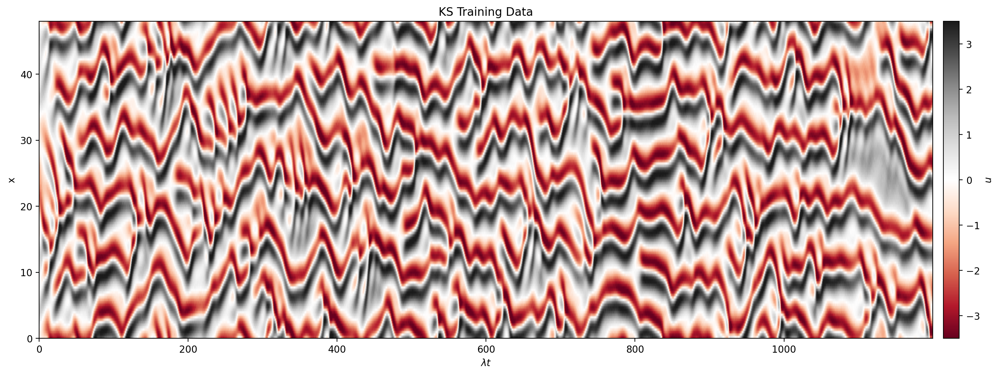

In [2]:
# integrate
Nx = 128
tN = 1500
domain = (0, 48)
lyap = 0.043
x0 = jnp.linspace(domain[0], domain[1], Nx, endpoint=True)  # Note: important to ensure PBC of IC. (however, the spectral solver throws away this point)
u0 = jnp.sin((3 / domain[1]) * jnp.pi * x0)
u0 = u0 + jax.random.normal(key=jax.random.key(3), shape=u0.shape)
dt = 0.25
U,t = orc.data.KS_1D(tN, u0=u0, dt=dt, domain=domain, Nx=Nx)
U_clean = U
U = U + jax.random.normal(key=jax.random.key(2), shape=U.shape) * jnp.std(U) * 0.03

# train test split
test_perc = 0.2
split_index = int((1 - test_perc) * U.shape[0])
U_train = U[:split_index, :]
U_test = U[split_index:, :]
t_train = t[:split_index]
t_test = jnp.linspace(0, U_test.shape[1]*dt, U_test.shape[1])

# visualize training data
vis.imshow_1D_spatiotemp(
    U_train,
    t_train[-1],
    domain,
    vmax=3.5,
    vmin=-3.5,
    title="KS Training Data",
    x_label= r"$\lambda t$",
)

In [3]:
# esn parameters
res_dim = 500 # number of reservoir neurons per chunk
chunks = 32  # number of chunks
locality = 6  # locality parameter for reservoir connections
beta = 1e-7

# init esn
esn = orc.models.ESNForecaster(data_dim=Nx,
                               res_dim=res_dim,
                               seed=2,
                               chunks=chunks,
                               locality=locality,
                               leak_rate=0.534,
                                embedding_scaling=0.088,
                                bias=1.915,
                                Wr_spectral_radius=0.757,
                                quadratic=True
                               )


In [5]:
esn, R = orc.models.train_ESNForecaster(
    esn,
    U_train,
    beta=beta
)

In [7]:
U_fcast = esn.forecast(1000, R[-1])

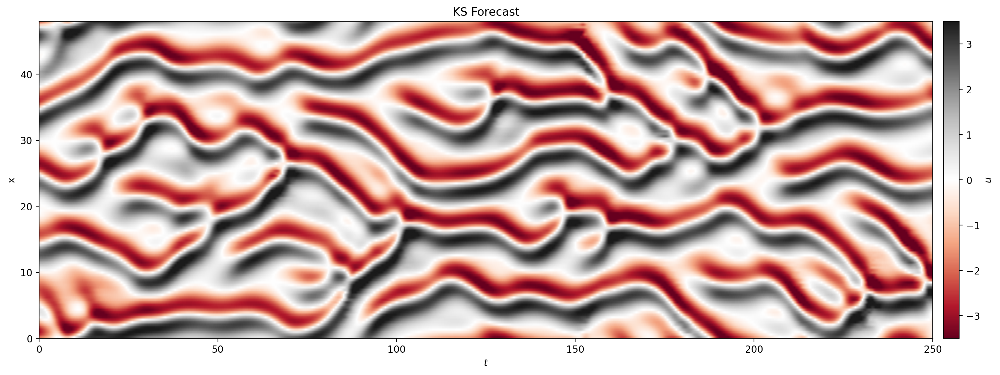

In [8]:
# imshow_1D_spatiotemp(fcast.T - U_test.T, test_perc * TN, domain, vmax=3.5, vmin=-3.5)
vis.imshow_1D_spatiotemp(
    U_fcast,
    U_fcast.shape[0] * dt,
    domain,
    vmax=3.5,
    vmin=-3.5,
    title="KS Forecast",
)

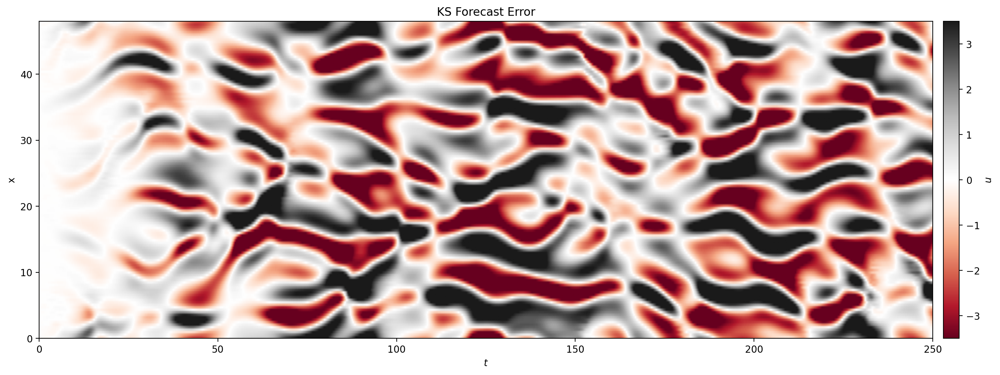

In [9]:
# imshow_1D_spatiotemp(fcast.T - U_test.T, test_perc * TN, domain, vmax=3.5, vmin=-3.5)
vis.imshow_1D_spatiotemp(
    (U_fcast - U_clean[U_train.shape[0]:U_train.shape[0] + 1000]),
    U_fcast.shape[0] * dt,
    domain,
    vmax=3.5,
    vmin=-3.5,
    title="KS Forecast Error",
)

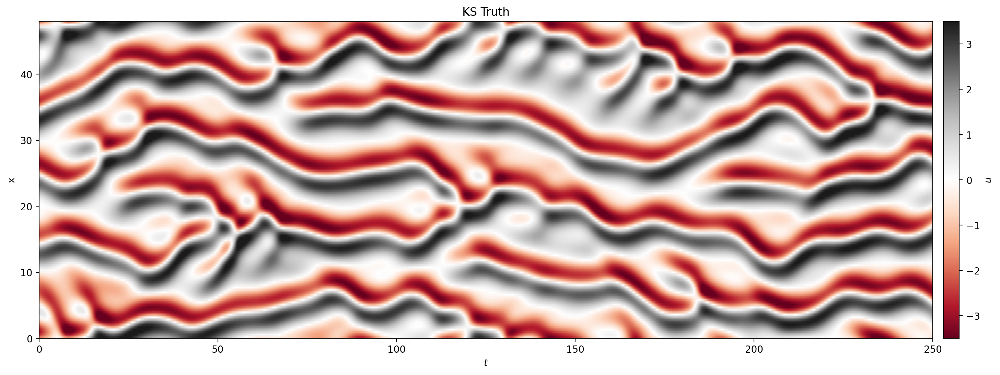

In [10]:
# imshow_1D_spatiotemp(fcast.T - U_test.T, test_perc * TN, domain, vmax=3.5, vmin=-3.5)
vis.imshow_1D_spatiotemp(
    U_clean[U_train.shape[0]:U_train.shape[0] + 1000],
    U_fcast.shape[0] * dt,
    domain,
    vmax=3.5,
    vmin=-3.5,
    title="KS Truth",
)